In [71]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from GRU import DatasetW
from GRU import RNN
from matplotlib.animation import FuncAnimation
from IPython.display import Image, display

In [2]:
pendulum = np.load('s_sincos.npy')

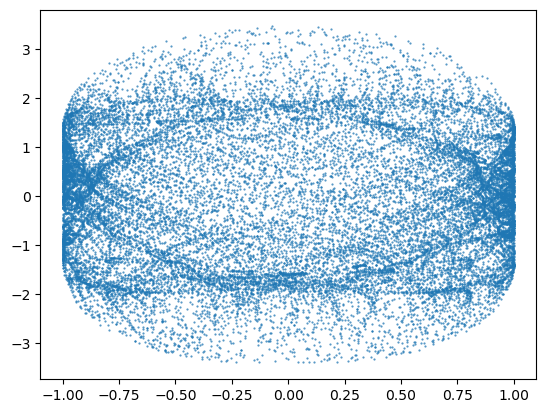

In [22]:
plt.scatter(pendulum[:24000, 0], pendulum[:24000, 5], s=0.3, alpha=0.8)

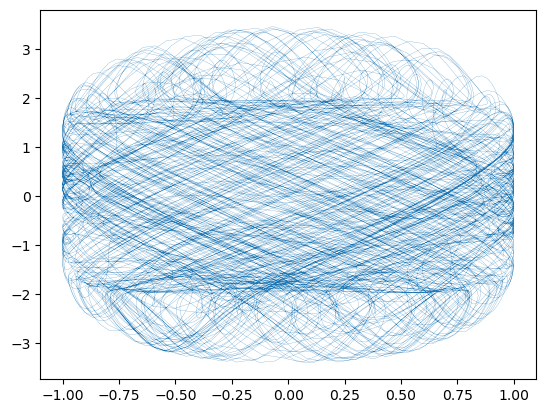

In [39]:
plt.plot(pendulum[:24000, 0], pendulum[:24000, 5], linewidth=0.14)

In [40]:
seq_length = 50
device = torch.device("cuda" if torch.cuda.is_available() else "cpu" if torch.backends.mps.is_available() else "cpu")
print(device)

cpu


In [41]:
train_dataset = DatasetW(pendulum[10000:][::2], seq_length)

In [42]:
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, drop_last=True)

In [43]:
model = RNN(input_size = 6, hidden_size = 600, output_size = 6)
model.load_state_dict(torch.load('model_pendulum.pth'))

<All keys matched successfully>

In [45]:
criterion = nn.MSELoss()  
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-5, betas=(0.9, 0.999))
num_epochs = 15
model.to(device)

RNN(
  (rnn_cell): GRU_Cell(
    (linear): Sequential(
      (0): Linear(in_features=600, out_features=600, bias=True)
      (1): ReLU()
      (2): Linear(in_features=600, out_features=6, bias=True)
    )
    (layer_norm): LayerNorm((600,), eps=1e-05, elementwise_affine=True)
  )
)

In [44]:
from GRU import train_model

In [10]:
train_model(model, train_loader, criterion, optimizer, num_epochs, device, normalize_sincos_values = True)

Epoch 0 of 15
Epoch 1 of 15
Epoch 2 of 15
Epoch 3 of 15
Epoch 4 of 15
Epoch 5 of 15
Epoch 6 of 15
Epoch 7 of 15
Epoch 8 of 15
Epoch 9 of 15
Epoch 10 of 15
Epoch 11 of 15
Epoch 12 of 15
Epoch 13 of 15
Epoch 14 of 15


In [22]:
torch.save(model.state_dict(), 'model_pendulum.pth')

In [57]:
def predict_futuree(model, seed_data, future_steps, mean, std):
        model.eval()
        d = seed_data.shape[1]
        if isinstance(seed_data, np.ndarray):
            seed_data = torch.tensor(seed_data, dtype=torch.float32).to(device)
        print(seed_data.shape)
        x = seed_data.view(1, -1, d)
        print(x.shape)
        with torch.no_grad():
            output, hidden = model(x[:, 0, :].unsqueeze(1))
            last_state = x[:, 0, :]
            for i in range(150):
                delta, hidden = model.rnn_cell(x[:, i, :], hidden)
                last_state = x[:, i, :]
                
            predictions = [last_state.unsqueeze(1)]
            
            for _ in range(future_steps - 1):
                out, hidden = model.rnn_cell(last_state, hidden)
                sin1, cos1 = out[:, 0], out[:, 1]
                norm1 = torch.sqrt(sin1**2 + cos1**2)
                out[:, 0] = sin1 / (norm1 + 1e-10)
                out[:, 1] = cos1 / (norm1 + 1e-10)
                
                sin2, cos2 = out[:, 2], out[:, 3]
                norm2 = torch.sqrt(sin2**2 + cos2**2)
                out[:, 2] = sin2 / (norm2 + 1e-10)
                out[:, 3] = cos2 / (norm2 + 1e-10)
                last_state = out
                predictions.append(last_state.unsqueeze(1))
                
            predictions = torch.cat(predictions, dim=1)
        
        pred_norm = predictions.squeeze().cpu().numpy()
        return pred_norm



In [58]:

pred_norm = predict_futuree(model, pendulum[10000:15000][::2], 5000, 0, 0)

torch.Size([2500, 6])
torch.Size([1, 2500, 6])


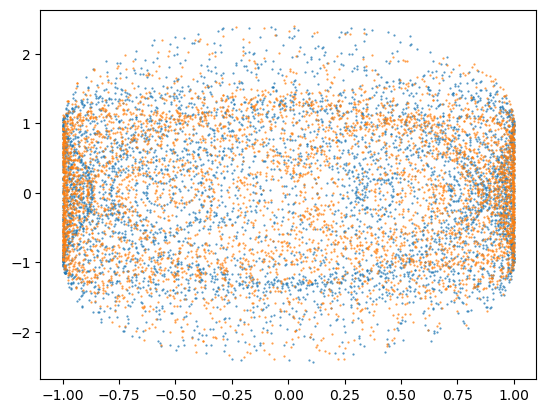

In [68]:
plt.scatter(pendulum[15000:25000, 0][::2], pendulum[15000:25000, 4][::2], s=0.3, alpha=0.8)
plt.scatter(pred_norm[:24000, 0], pred_norm[:24000, 4], s=0.3, alpha=0.8)


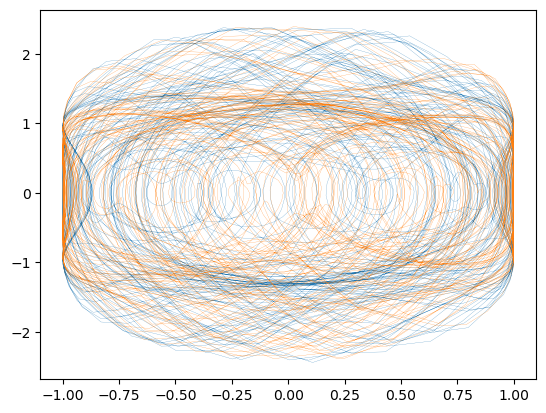

In [69]:
plt.plot(pendulum[15000:25000, 0][::2], pendulum[15000:25000, 4][::2], linewidth=0.14)
plt.plot(pred_norm[:24000, 0], pred_norm[:24000, 4], linewidth=0.14)

In [49]:
lyap = model.lyapunov_exponents(pendulum[10000:][::2], 2500, 0.1, 500, 1, 1, 0, True)

In [50]:
lyap

array([ 2.56148398e-01,  1.36814069e-03, -3.11239272e-01, -1.42832041e+00,
       -3.55733919e+00, -4.39963770e+00, -4.66405582e+00, -4.68067122e+00,
       -4.81735611e+00, -4.86385918e+00, -4.96881628e+00, -5.03176498e+00,
       -5.13343096e+00, -5.20570421e+00, -5.30829668e+00, -5.37350273e+00,
       -5.48564291e+00, -5.51975250e+00, -5.57703733e+00, -5.64710951e+00,
       -5.66168976e+00, -5.66702080e+00, -5.72465611e+00, -5.74035025e+00,
       -5.77812529e+00, -5.79335976e+00, -5.81758070e+00, -5.84456158e+00,
       -5.86993647e+00, -5.89276505e+00, -5.90380096e+00, -5.93260813e+00,
       -5.94650364e+00, -5.99448013e+00, -5.99593735e+00, -6.02826834e+00,
       -6.05059624e+00, -6.05583286e+00, -6.07783747e+00, -6.08669376e+00,
       -6.11759567e+00, -6.13124895e+00, -6.14831972e+00, -6.16170454e+00,
       -6.18495035e+00, -6.20709848e+00, -6.19298792e+00, -6.23577785e+00,
       -6.24743032e+00, -6.26951075e+00, -6.27522850e+00, -6.29974842e+00,
       -6.31391478e+00, -

In [51]:
def sincos_to_angles(predictions_sincos):
    sin_theta1 = predictions_sincos[:, 0]
    cos_theta1 = predictions_sincos[:, 1]
    sin_theta2 = predictions_sincos[:, 2]
    cos_theta2 = predictions_sincos[:, 3]
    omega1 = predictions_sincos[:, 4]
    omega2 = predictions_sincos[:, 5]
    theta1 = np.arctan2(sin_theta1, cos_theta1)
    theta2 = np.arctan2(sin_theta2, cos_theta2)
    
    return np.column_stack([theta1, theta2, omega1, omega2])

In [ ]:

predictions_angles = sincos_to_angles(pred_norm)

skip = 1
dt = 0.1
s_anim = predictions_angles[:1000:skip, :]
t_anim = np.arange(0, len(s_anim)*dt, dt) 


In [53]:
theta1 = s_anim[:, 0]
theta2 = s_anim[:, 1]
x1 = np.sin(theta1)
y1 = -np.cos(theta1)
x2 = x1 + np.sin(theta2)
y2 = y1 - np.cos(theta2)

In [54]:
g = 9.81
dtheta1 = s_anim[:, 2]
dtheta2 = s_anim[:, 3]
v1_x = np.cos(theta1) * dtheta1
v1_y = np.sin(theta1) * dtheta1
v2_x = v1_x + np.cos(theta2) * dtheta2
v2_y = v1_y + np.sin(theta2) * dtheta2
E_anim = g * (0.5*(v1_x**2 + v1_y**2 + v2_x**2 + v2_y**2) + (y1 + y2))

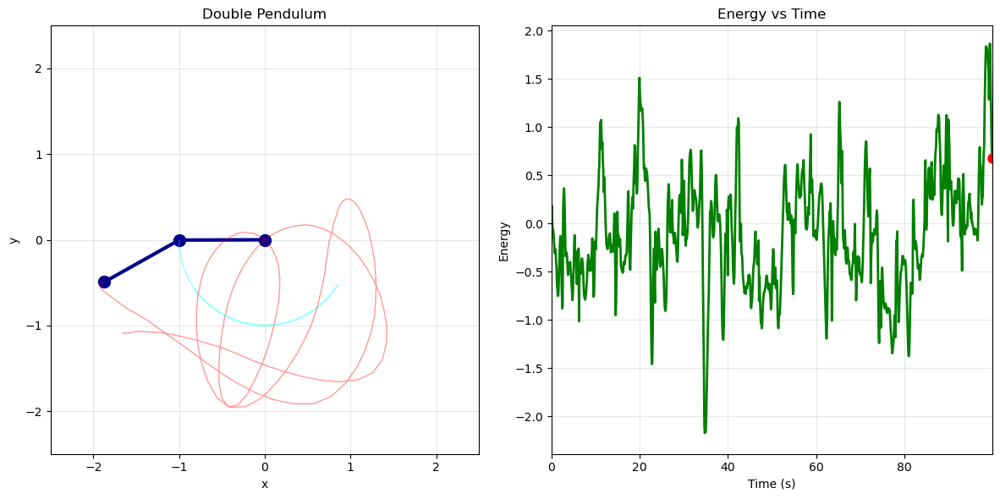

In [55]:
fig = plt.figure(figsize=(12, 6))
ax1 = plt.subplot(121)
ax2 = plt.subplot(122)

ax1.set_xlim(-2.5, 2.5)
ax1.set_ylim(-2.5, 2.5)
ax1.set_aspect('equal')
ax1.grid(True, alpha=0.3)
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_title('Double Pendulum')

ax2.set_xlim(0, t_anim[-1])
ax2.set_ylim(E_anim.min()*1.1, E_anim.max()*1.1)
ax2.grid(True, alpha=0.3)
ax2.set_xlabel('Time (s)')
ax2.set_ylabel('Energy')
ax2.set_title('Energy vs Time')

line, = ax1.plot([], [], 'o-', lw=3, markersize=10, color='darkblue')
trace1, = ax1.plot([], [], '-', lw=1, alpha=0.4, color='cyan')
trace2, = ax1.plot([], [], '-', lw=1, alpha=0.4, color='red')
energy_line, = ax2.plot([], [], 'g-', lw=2)
energy_point, = ax2.plot([], [], 'ro', markersize=8)

trace_length = 150
x1_hist, y1_hist = [], []
x2_hist, y2_hist = [], []
t_hist, e_hist = [], []

def init():
    line.set_data([], [])
    trace1.set_data([], [])
    trace2.set_data([], [])
    energy_line.set_data([], [])
    energy_point.set_data([], [])
    return line, trace1, trace2, energy_line, energy_point

def animate(i):
    x_points = [0, x1[i], x2[i]]
    y_points = [0, y1[i], y2[i]]
    line.set_data(x_points, y_points)
    
    x1_hist.append(x1[i])
    y1_hist.append(y1[i])
    x2_hist.append(x2[i])
    y2_hist.append(y2[i])
    
    if len(x1_hist) > trace_length:
        x1_hist.pop(0)
        y1_hist.pop(0)
        x2_hist.pop(0)
        y2_hist.pop(0)
    
    trace1.set_data(x1_hist, y1_hist)
    trace2.set_data(x2_hist, y2_hist)
    
    t_hist.append(t_anim[i])
    e_hist.append(E_anim[i])
    energy_line.set_data(t_hist, e_hist)
    energy_point.set_data([t_anim[i]], [E_anim[i]])
    
    
    return line, trace1, trace2, energy_line, energy_point

anim = FuncAnimation(fig, animate, init_func=init,
                    frames=len(t_anim), interval=20, blit=True)

plt.tight_layout()
anim.save('double_pendulum_GRU.gif', writer='pillow')
plt.show()

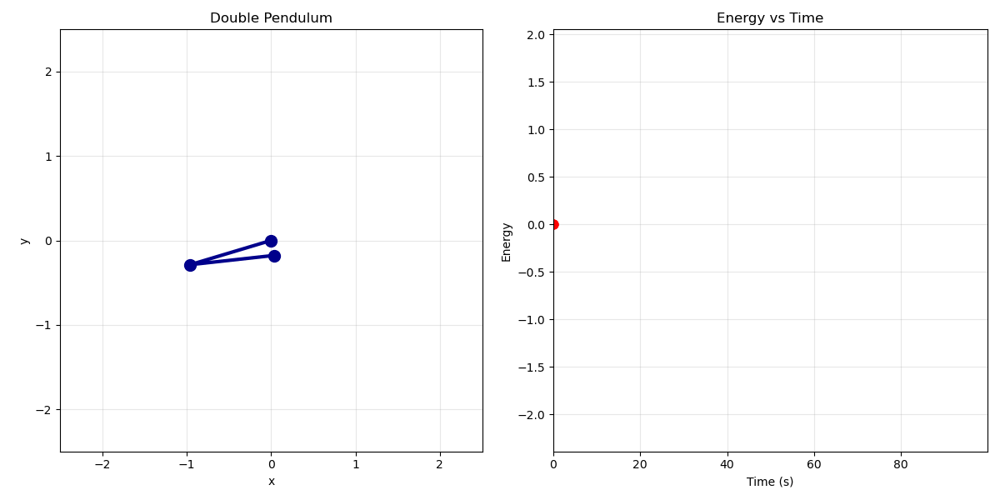

In [ ]:

display(Image(filename='double_pendulum_GRU.gif'))
